In [22]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_retrieval, pairs_from_exhaustive
from hloc.utils import viz_3d
from hloc.visualization import plot_images, read_image

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Setup
In this notebook, we will run SfM reconstruction from scratch on a set of images. We choose the [South-Building dataset](https://openaccess.thecvf.com/content_cvpr_2013/html/Hane_Joint_3D_Scene_2013_CVPR_paper.html) - we will download it later. First, we define some paths.

In [24]:
images = Path('datasets/South-Building/images/')

outputs = Path('outputs/sfm/')
local_features = outputs / 'local_features.h5'
sfm_pairs = outputs / 'pairs-netvlad.txt'
sfm_dir = outputs / 'sfm_superpoint+superglue'
loc_pairs = outputs / 'pairs-loc.txt'
matches = outputs / 'matches.h5'

retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

## Download the dataset
The dataset is simply a set of images. The intrinsic parameters will be extracted from the EXIF data and refined with SfM.

In [3]:
if not images.exists():
    !wget http://cvg.ethz.ch/research/local-feature-evaluation/South-Building.zip -P datasets/
    !unzip -q datasets/South-Building.zip -d datasets/

URL transformed to HTTPS due to an HSTS policy
--2023-08-23 16:56:40--  https://cvg.ethz.ch/research/local-feature-evaluation/South-Building.zip
Resolving cvg.ethz.ch (cvg.ethz.ch)... 129.132.114.108
Connecting to cvg.ethz.ch (cvg.ethz.ch)|129.132.114.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 230948942 (220M) [application/zip]
Saving to: ‘datasets/South-Building.zip’

South-Building.zip  100%[===================>] 220.25M   522KB/s    in 24m 4s  

2023-08-23 17:20:46 (156 KB/s) - ‘datasets/South-Building.zip’ saved [230948942/230948942]



## Find image pairs via image retrieval
We extract global descriptors with NetVLAD and find for each image the most similar ones. For smaller dataset we can instead use exhaustive matching via `hloc/pairs_from_exhaustive.py`, which would find $\frac{n(n-1)}{2}$ images pairs.

In [4]:
retrieval_path = extract_features.main(retrieval_conf, images, outputs)
pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=5)

[2023/08/23 17:20:48 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2023/08/23 17:20:48 hloc INFO] Found 128 images in root datasets/South-Building/images.
100%|█████████████████████████████████████████| 128/128 [00:26<00:00,  4.84it/s]
[2023/08/23 17:21:23 hloc INFO] Finished exporting features.
[2023/08/23 17:21:23 hloc INFO] Extracting image pairs from a retrieval database.


1
2
3
4
5
7


[2023/08/23 17:21:23 hloc INFO] Found 640 pairs.


## Extract and match local features

In [5]:
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(matcher_conf, sfm_pairs, feature_conf['output'], outputs)

[2023/08/23 17:21:23 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2023/08/23 17:21:23 hloc INFO] Found 128 images in root datasets/South-Building/images.


Loaded SuperPoint model


100%|█████████████████████████████████████████| 128/128 [00:07<00:00, 17.52it/s]
[2023/08/23 17:21:31 hloc INFO] Finished exporting features.
[2023/08/23 17:21:31 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|█████████████████████████████████████████| 397/397 [00:44<00:00,  9.01it/s]
[2023/08/23 17:22:16 hloc INFO] Finished exporting matches.


## 3D reconstruction
Run COLMAP on the features and matches.

In [6]:
model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path)

[2023/08/23 17:22:16 hloc INFO] Creating an empty database...
[2023/08/23 17:22:16 hloc INFO] Importing images into the database...
[2023/08/23 17:22:29 hloc INFO] Importing features into the database...
100%|████████████████████████████████████████| 128/128 [00:00<00:00, 644.54it/s]
[2023/08/23 17:22:29 hloc INFO] Importing matches into the database...
100%|███████████████████████████████████████| 640/640 [00:00<00:00, 1431.69it/s]
[2023/08/23 17:22:30 hloc INFO] Performing geometric verification of the matches...
[2023/08/23 17:22:34 hloc INFO] Running 3D reconstruction...
[2023/08/23 17:25:02 hloc INFO] Reconstructed 1 model(s).
[2023/08/23 17:25:02 hloc INFO] Largest model is #0 with 128 images.
[2023/08/23 17:25:02 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 128
	num_cameras = 1
	num_points3D = 36997
	num_observations = 187273
	mean_track_length = 5.06184
	mean_observations_per_image = 1463.07
	mean_reprojection_error = 1.41632
	num_input_images = 128


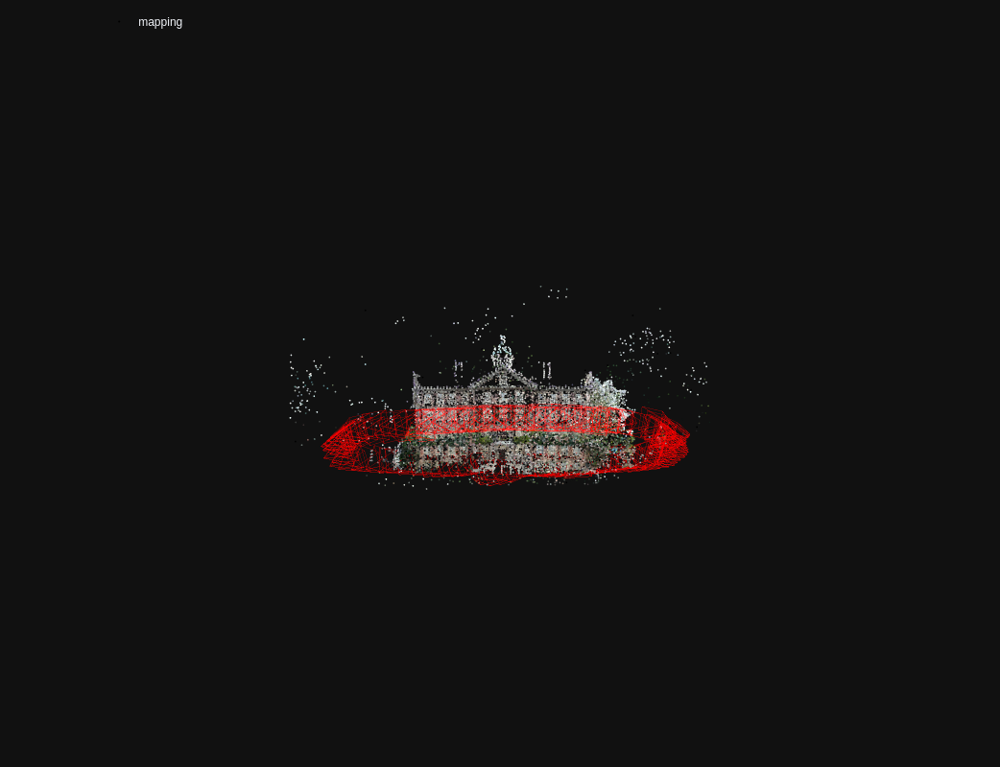

In [12]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping", points_rgb=True)
fig.show()

## Visualization
We visualize some of the registered images, and color their keypoint by visibility, track length, or triangulated depth.

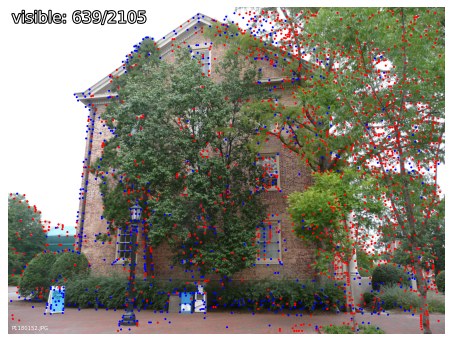

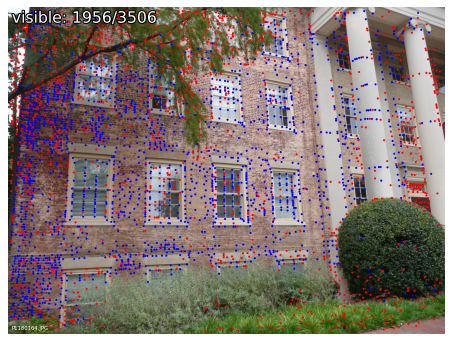

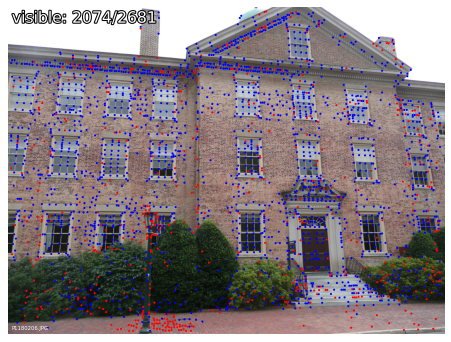

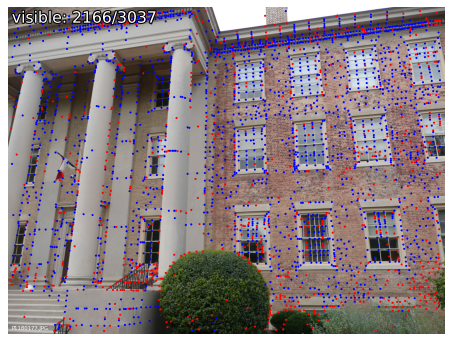

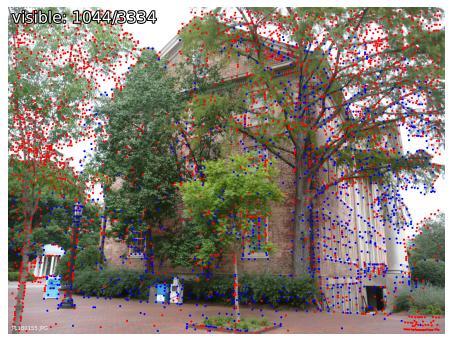

In [7]:
visualization.visualize_sfm_2d(model, images, color_by='visibility', n=5)

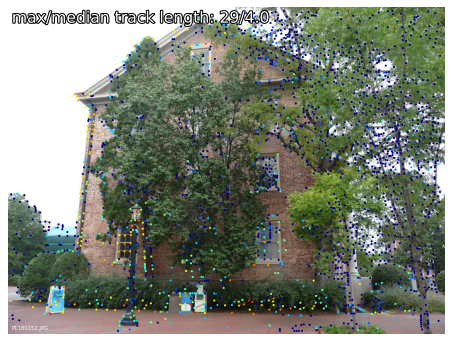

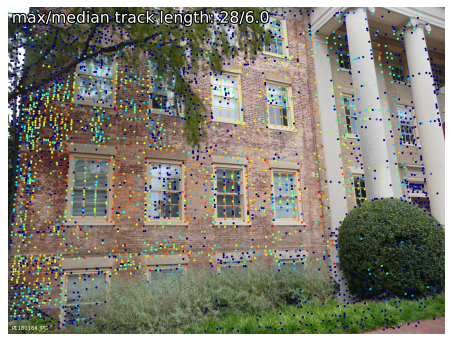

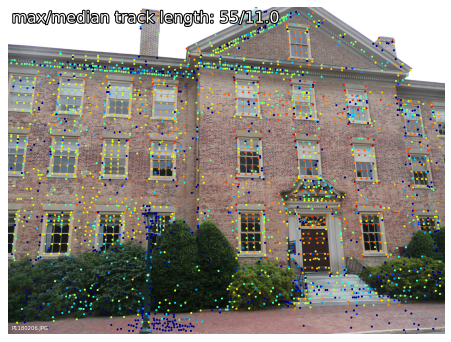

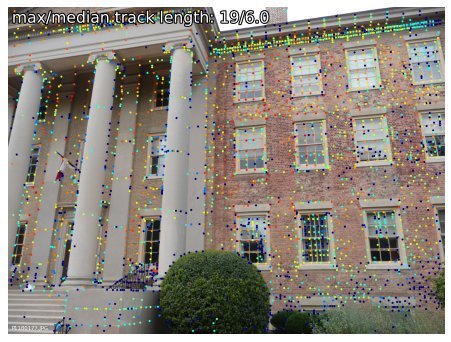

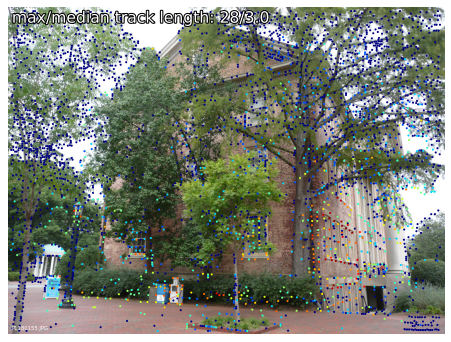

In [8]:
visualization.visualize_sfm_2d(model, images, color_by='track_length', n=5)

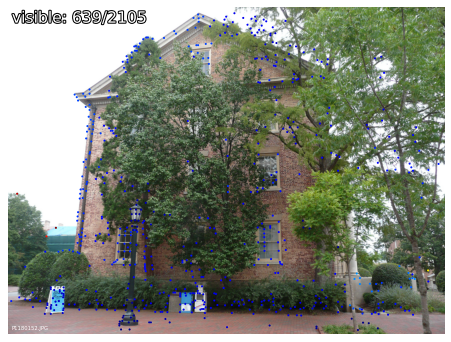

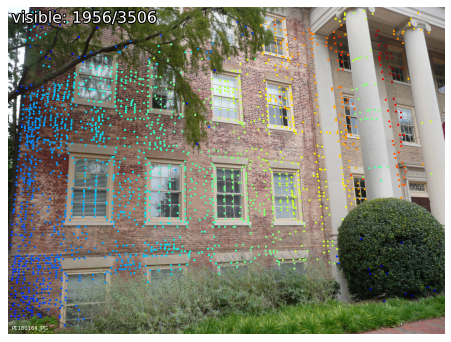

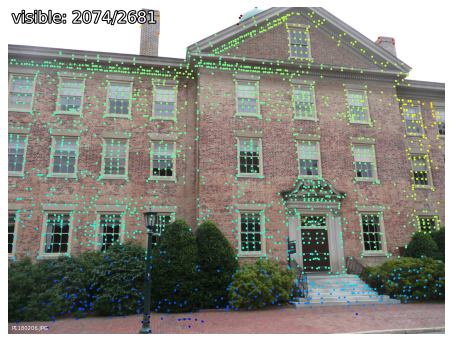

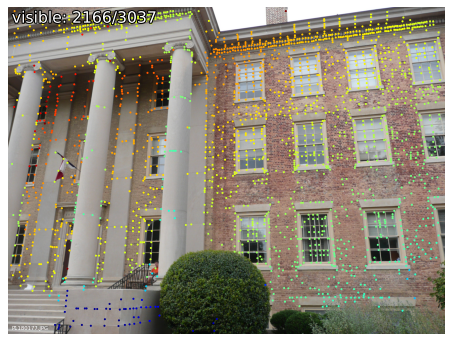

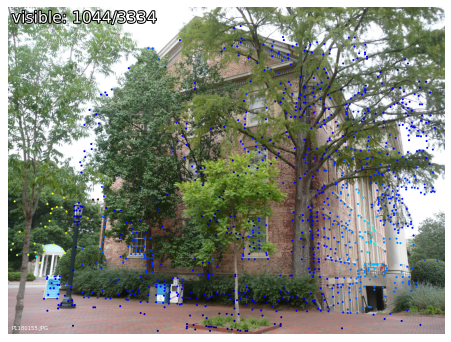

In [9]:
visualization.visualize_sfm_2d(model, images, color_by='depth', n=5)

In [28]:
query = './P1180141.JPG'

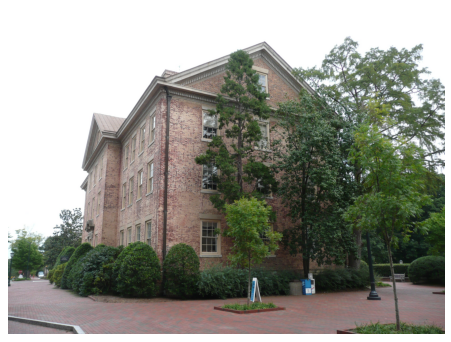

In [29]:
plot_images([read_image(images / query)], dpi=75)